In [1]:
import torch
import wandb
import torchvision

import numpy as np

from data_generator import DataGenerator
from default_mnist_config import create_default_mnist_config
from diffusion import DiffusionRunner
from models.classifier import ResNet, ResidualBlock, ConditionalResNet

from matplotlib import pyplot as plt

import os

In [2]:
device = torch.device('cuda')
classifier_args = {
    "block": ResidualBlock,
    "layers": [2, 2, 2, 2]
}
noisy_classifier = ConditionalResNet(**classifier_args)
noisy_classifier.to(device)

noisy_classifier.load_state_dict(torch.load('./ddpm_checkpoints/classifier.pth'))

clean_classifier = ResNet(**classifier_args)
clean_classifier.to(device)

clean_classifier.load_state_dict(torch.load('./ddpm_checkpoints/clean_classifier.pth'))

<All keys matched successfully>

#### Создайте два семплемера картинок, безусловный и условный с методом .set_classifier

In [3]:
conditional_diffusion = DiffusionRunner(create_default_mnist_config(), eval=True)
conditional_diffusion.set_classifier(noisy_classifier, T=1.)

unconditional_diffusion = DiffusionRunner(create_default_mnist_config(), eval=True)

In [4]:
def get_pred_labels(images_normed: torch.Tensor):
    """
    predict labels for normed images 
    [-1, 1]
    """
    with torch.no_grad():
        logits = clean_classifier(images_normed, t=None)

    return logits.max(dim=1)[1]


def calc_acc_clean_classifier(images_normed: torch.Tensor, labels: torch.Tensor):
    """
    calculate accuracy using clean classifier
    """
    pred_labels = get_pred_labels(images_normed)
    mask = (pred_labels == labels).float()
    
    return mask.mean()


def sample_images(diff_process, labels=None):
    images_tensor = diff_process.sample_images(batch_size=100, labels=labels)
    images_cpu = images_tensor.cpu()
    grid = torchvision.utils.make_grid(images_cpu, nrow=10).permute(1, 2, 0)
    grid = grid.data.numpy().astype(np.uint8)

    plt.imshow(grid)
    plt.show()
    return images_tensor


def cond_print_and_calc_acc(class_num: int):
    labels = class_num*torch.ones(100).long().to(device)
    images_tensor = sample_images(conditional_diffusion, labels)
    acc = calc_acc_clean_classifier((images_tensor - 127.5)/ 127.5, labels=labels)
    print('Accuracy: ', acc.item())
    return images_tensor

#### Посемплируйте наборы картинок всех классов обоими способами, изменить температуру можно с помощью повторного .set_classifier

In [5]:
clean_classifier.eval();

In [6]:
noisy_classifier.eval();

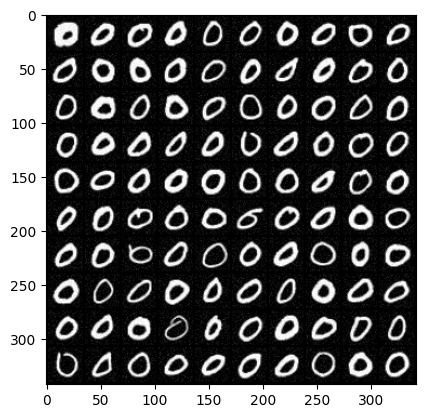

Accuracy:  0.9699999690055847


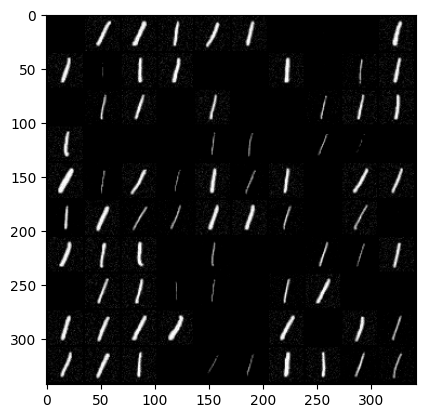

Accuracy:  0.9699999690055847


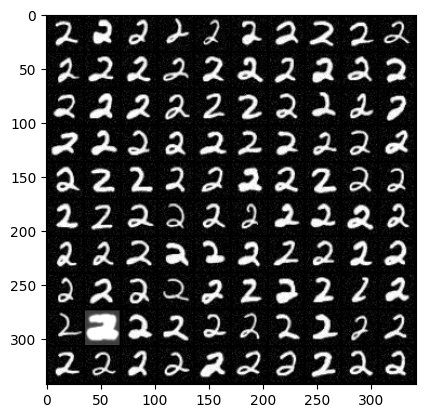

Accuracy:  0.9899999499320984


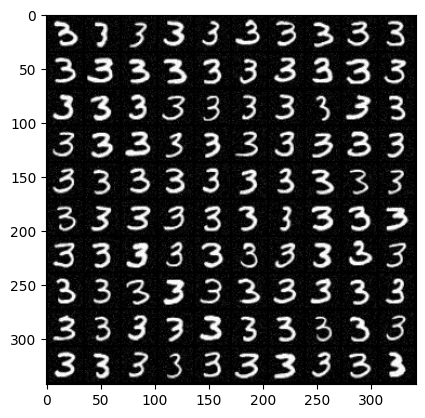

Accuracy:  1.0


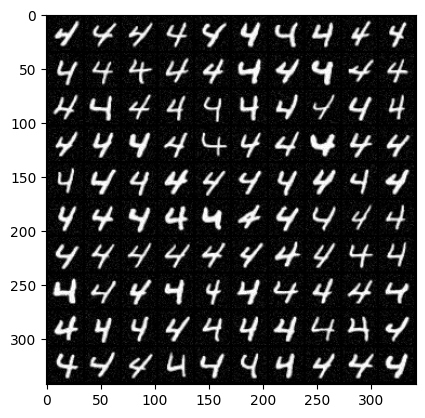

Accuracy:  1.0


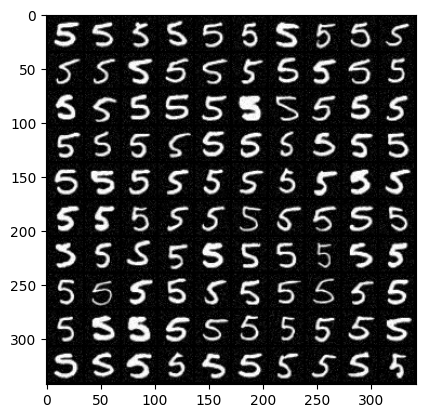

Accuracy:  1.0


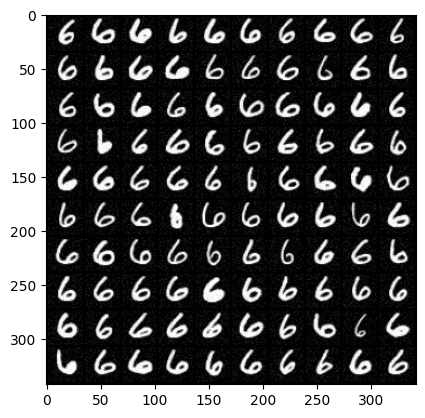

Accuracy:  1.0


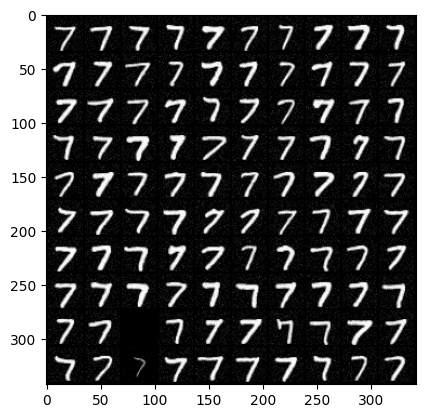

Accuracy:  0.9799999594688416


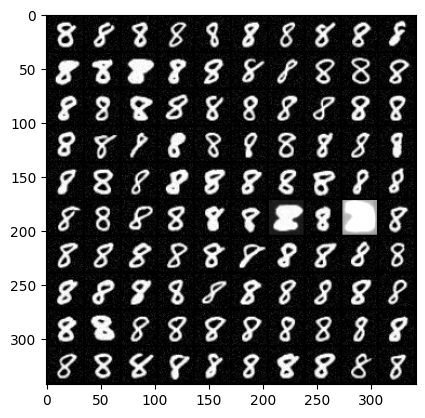

Accuracy:  0.9899999499320984


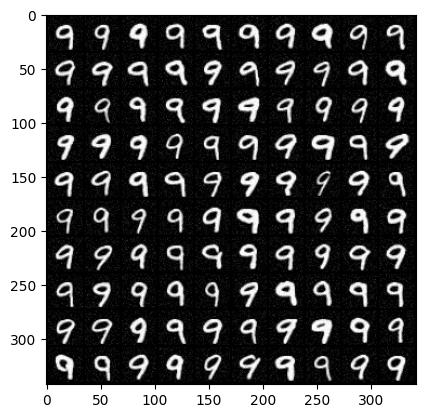

Accuracy:  0.9899999499320984


In [9]:
conditional_diffusion.set_classifier(noisy_classifier, T=0.1)

for i in range(10):  
  cond_print_and_calc_acc(i)

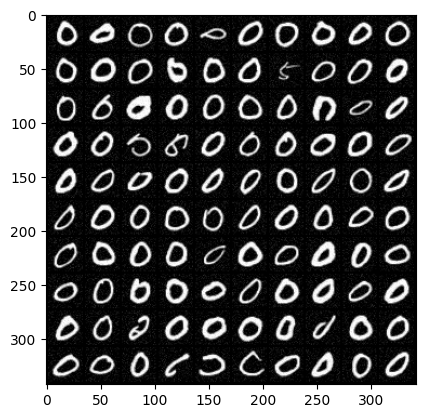

Accuracy:  0.8899999856948853


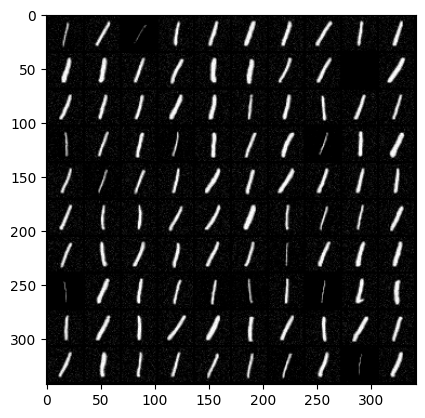

Accuracy:  0.949999988079071


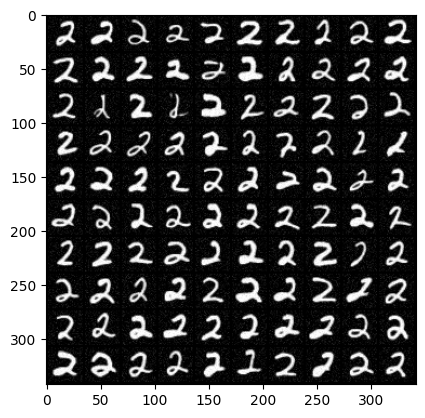

Accuracy:  0.9699999690055847


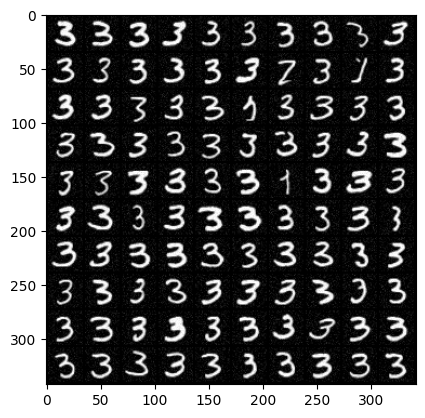

Accuracy:  0.9599999785423279


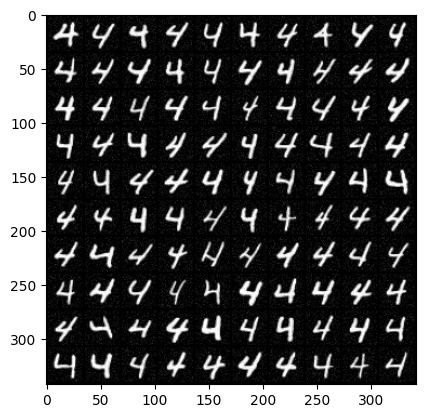

Accuracy:  1.0


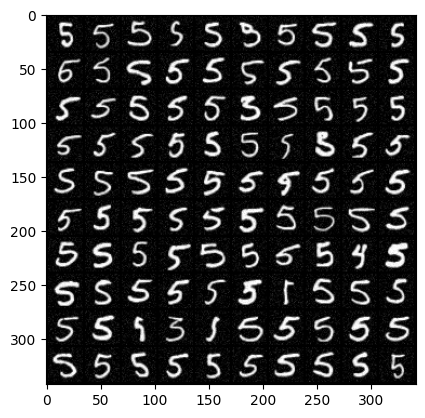

Accuracy:  0.949999988079071


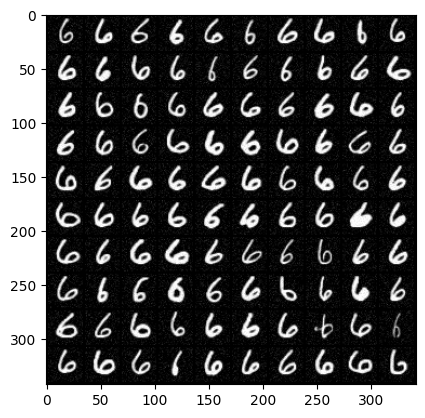

Accuracy:  1.0


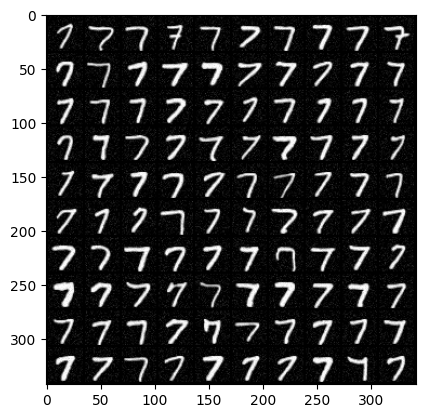

Accuracy:  0.9699999690055847


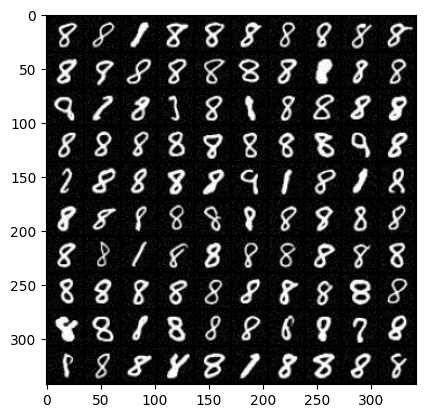

Accuracy:  0.8899999856948853


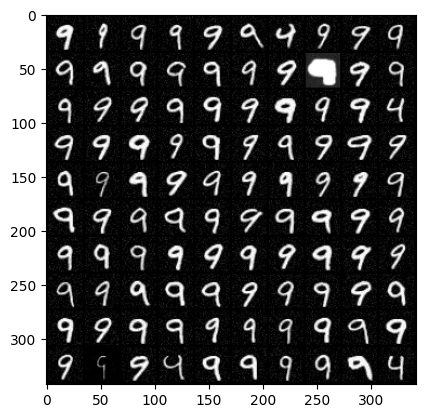

Accuracy:  0.9199999570846558


In [11]:
conditional_diffusion.set_classifier(noisy_classifier, T=0.25)

for i in range(10):  
  cond_print_and_calc_acc(i)

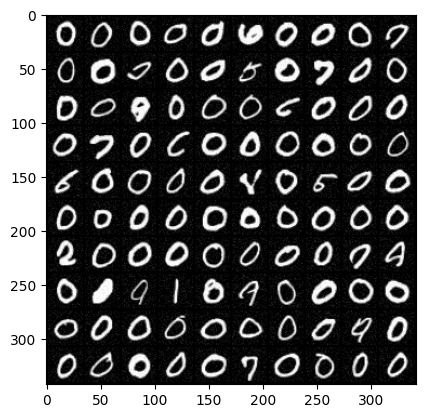

Accuracy:  0.8199999928474426


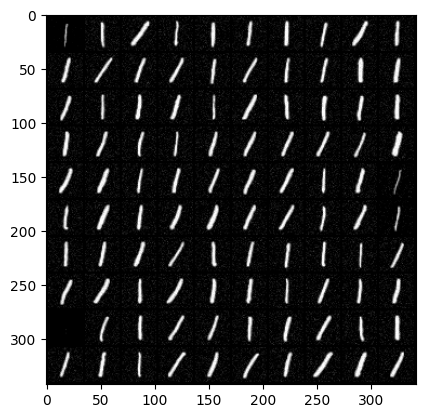

Accuracy:  0.9899999499320984


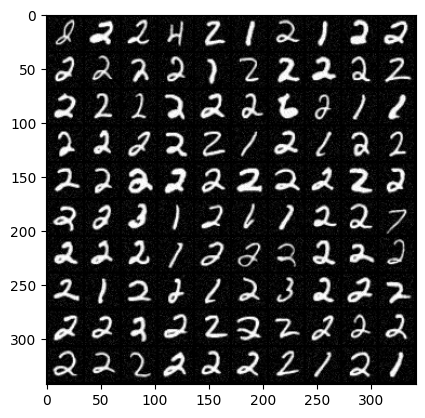

Accuracy:  0.7699999809265137


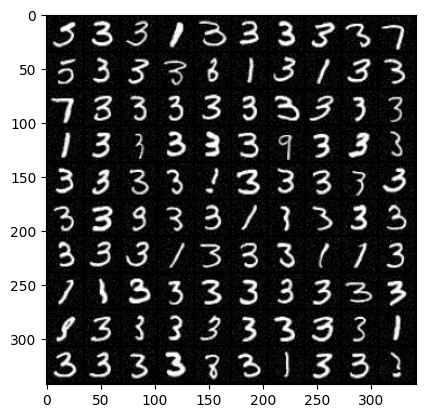

Accuracy:  0.7599999904632568


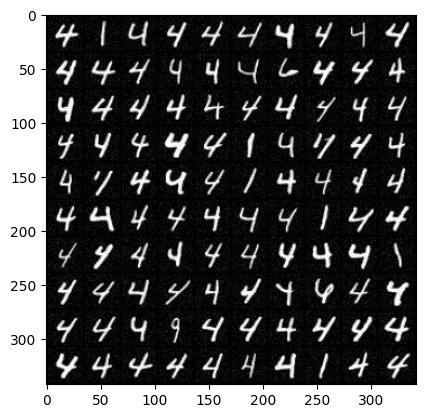

Accuracy:  0.9300000071525574


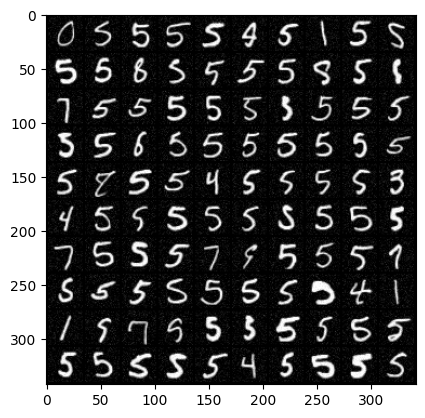

Accuracy:  0.7899999618530273


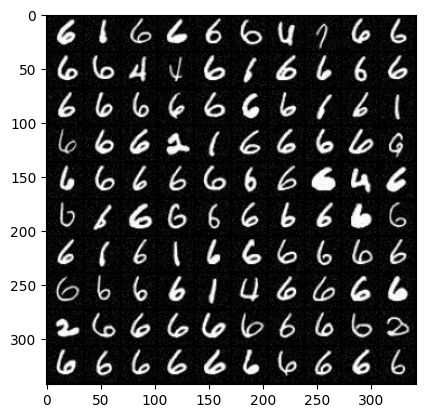

Accuracy:  0.85999995470047


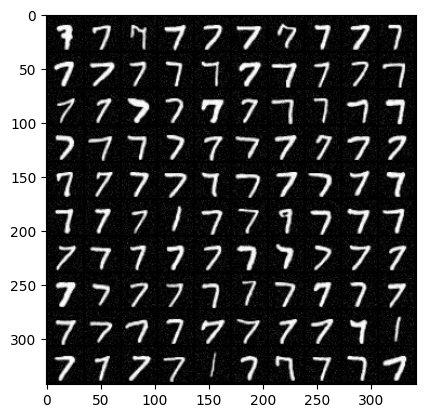

Accuracy:  0.9199999570846558


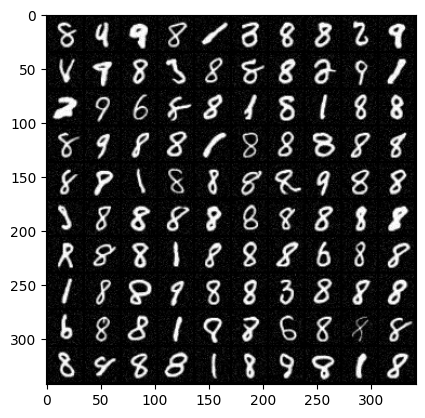

Accuracy:  0.7199999690055847


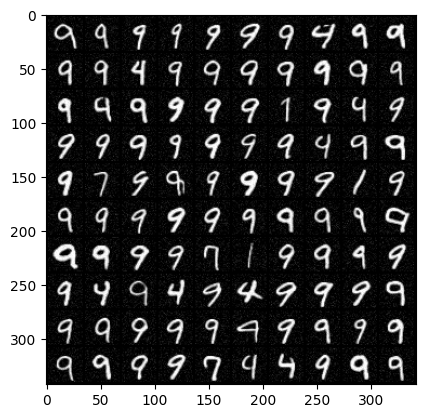

Accuracy:  0.7899999618530273


In [12]:
conditional_diffusion.set_classifier(noisy_classifier, T=0.5)

for i in range(10):  
  cond_print_and_calc_acc(i)

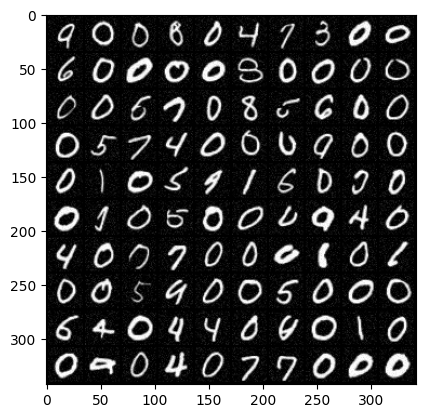

Accuracy:  0.5799999833106995


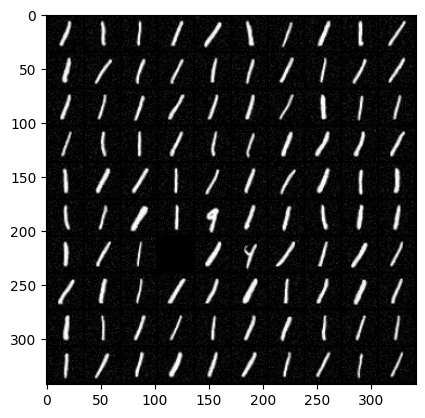

Accuracy:  0.9399999976158142


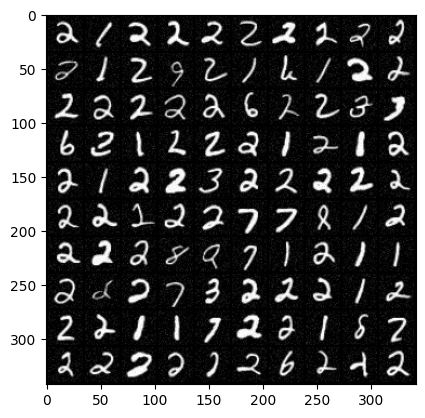

Accuracy:  0.6200000047683716


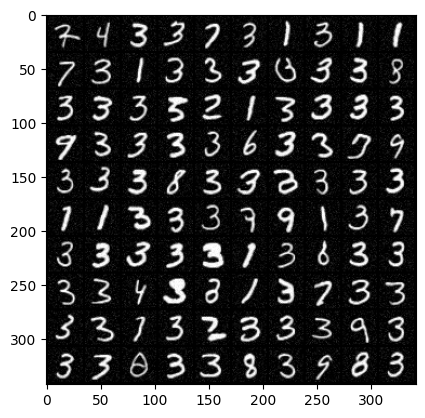

Accuracy:  0.6499999761581421


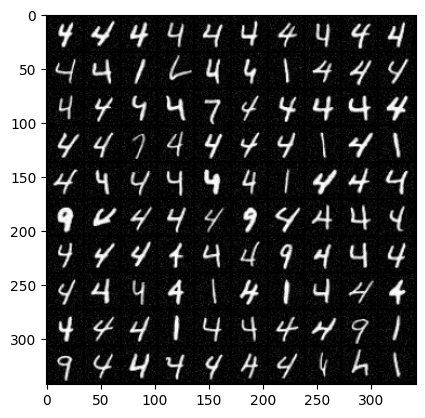

Accuracy:  0.8199999928474426


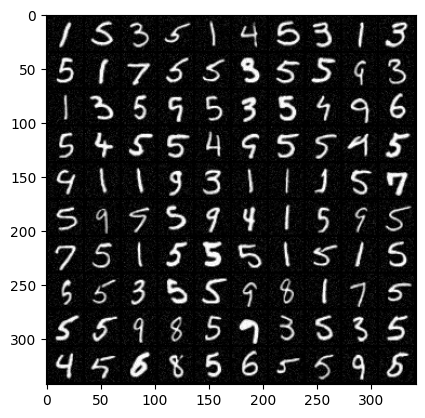

Accuracy:  0.4399999976158142


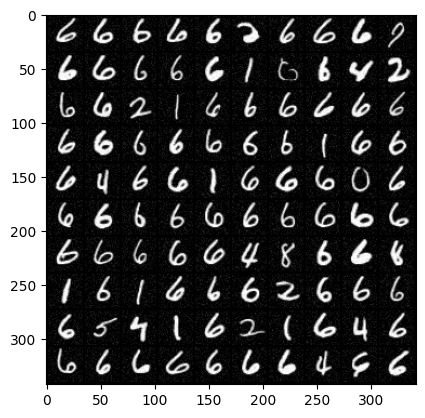

Accuracy:  0.7599999904632568


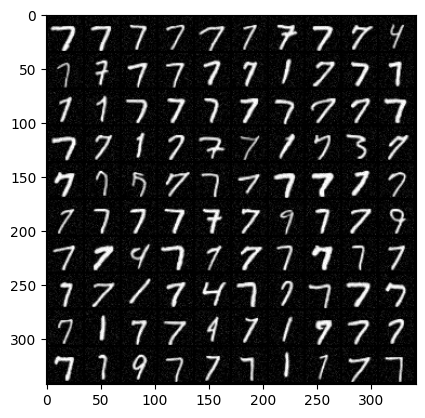

Accuracy:  0.7899999618530273


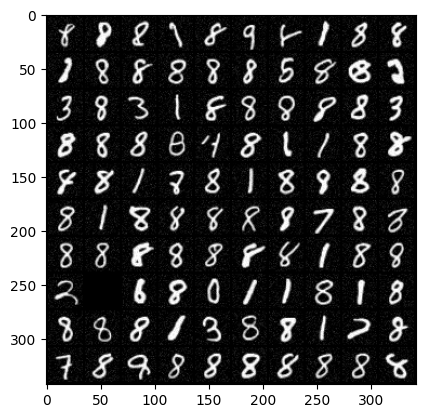

Accuracy:  0.6899999976158142


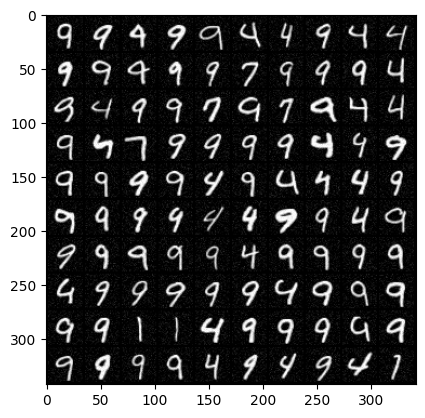

Accuracy:  0.6399999856948853


In [13]:
conditional_diffusion.set_classifier(noisy_classifier, T=0.8)

for i in range(10):  
  cond_print_and_calc_acc(i)

> Как сильно влияет температура на отличимость семплов при условной генерации? Продеменстрируйте для разных T свои выводы.



Были взяты 4 значения для температуры: 0.1, 0.25, 0.5 и 0.8

Видно, что при увеличении температуры качество ухудшается и сэмплы становятся хуже (уменьшается вклад classifier guidance)

При T = 0.1 качество на всех цифрах очень близко к идеальному

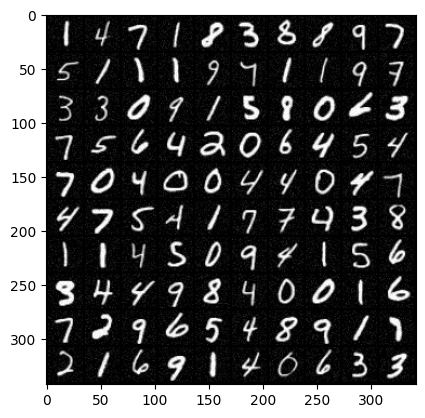

In [16]:
sample_images(unconditional_diffusion);

> Какое качество получается у чистого классификатора при условной генерации? Попробуйте оценить на глаз качество чистого классификатора для безусловной генерации, объясните свои выводы.


Для безусловной генерации я бы оценил качество в 0.95-0.99